<a href="https://colab.research.google.com/github/dbui836/cmps422_demo/blob/main/c00496012_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# IMPORTANT NOTE: THE CODE IN THIS NOTEBOOK IS BASED OFF OF CODE FOUND
# IN THE DOCUMENTATION OF HOW TO USE A HUGGING FACE VIT ON https://huggingface.co/google/vit-base-patch16-224
# THE CODE BELOW WAS MODIFIED TO LOAD/PREDICT MULTIPLE IMAGES FROM A GITHUB REPO

!git clone https://github.com/dbui836/cmps422_demo.git

Cloning into 'cmps422_demo'...
remote: Enumerating objects: 43, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 43 (delta 2), reused 13 (delta 2), pack-reused 0 (from 0)
Receiving objects: 100% (43/43), 24.65 MiB | 25.67 MiB/s, done.
Resolving deltas: 100% (2/2), done.


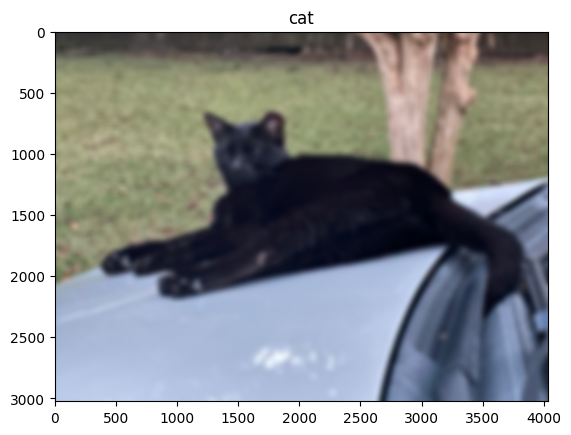

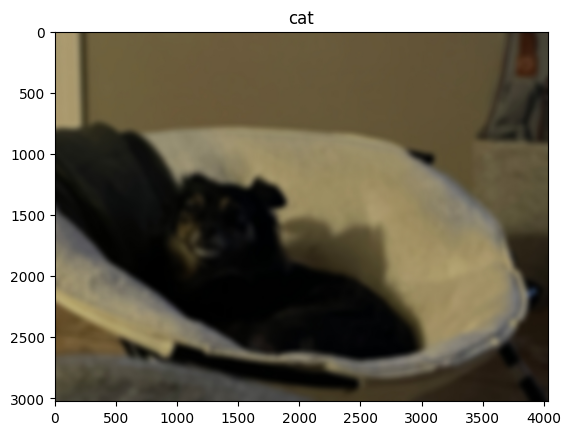

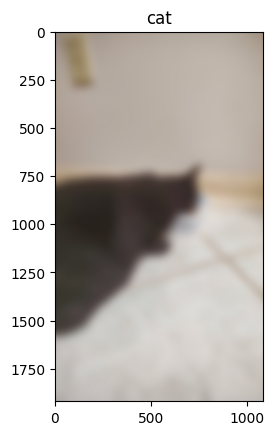

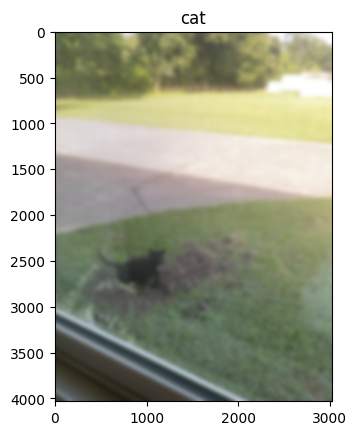

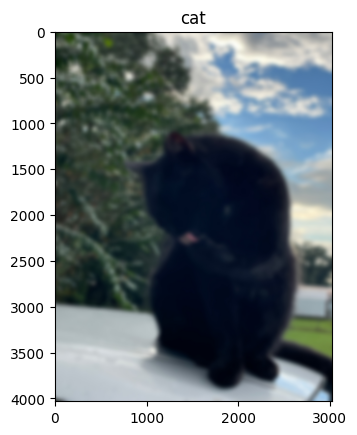

...

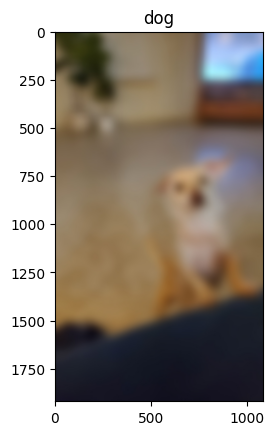

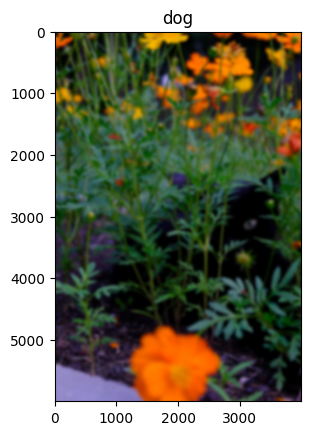

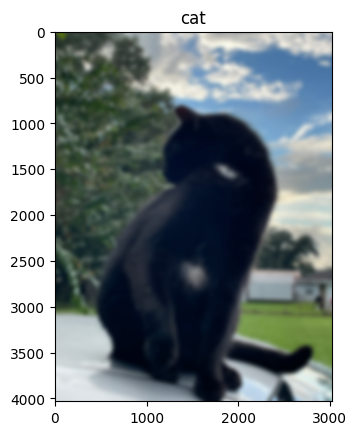

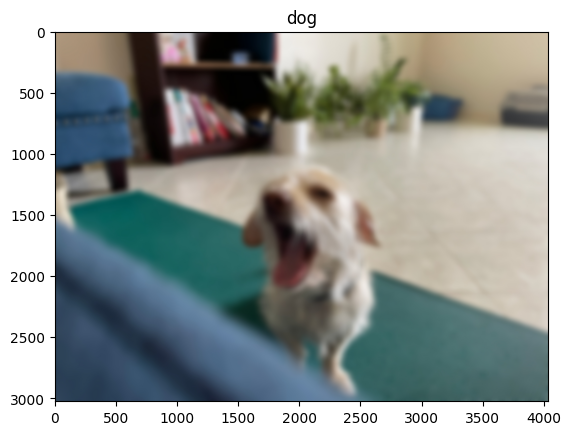

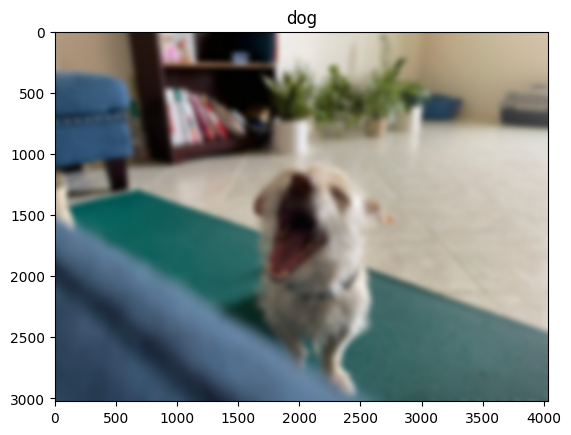

In [9]:
from transformers import ViTImageProcessor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

import os

# load my fine tuned Vit
processor = ViTImageProcessor.from_pretrained("cmps422_demo/vit_fine_tuned-f1")
model = ViTForImageClassification.from_pretrained("cmps422_demo/vit_fine_tuned-f1")

# Feed the model multiple images from a folder
# Display the image and prediction
for file in os.listdir("cmps422_demo/Images_blurred"):
    if file.endswith('.jpg'):
      # load image
      path = os.path.join("cmps422_demo/Images_blurred", file)
      image = Image.open(path)
      # Feed model
      inputs = processor(images=image, return_tensors="pt")
      outputs = model(**inputs)
      # Results
      logits = outputs.logits # logits are raw results (no softmax or normalization stuff)
      predicted_class_idx = logits.argmax(-1).item() # But can still access what the final class prediction is
      plt.imshow(image)
      plt.title(model.config.id2label[predicted_class_idx])
      plt.show() # Note: the original images are shown, not the processed images the model sees


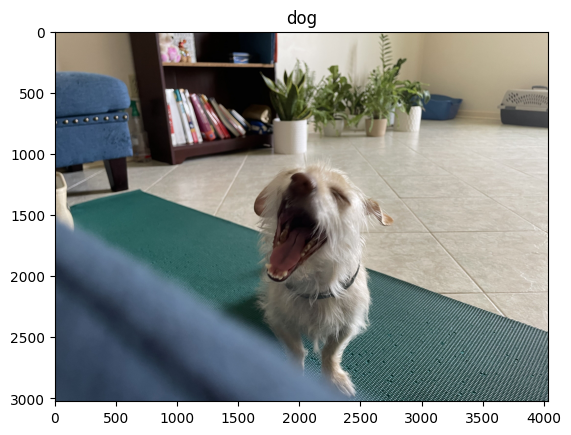

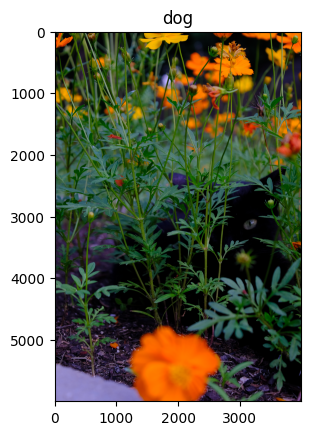

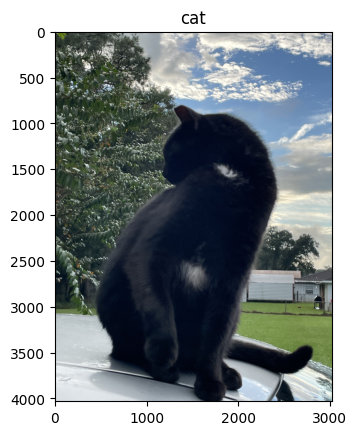

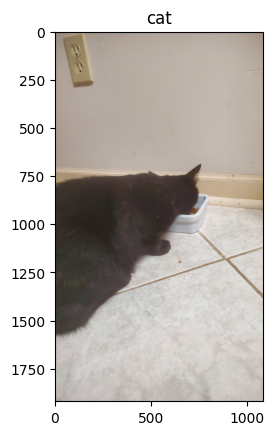

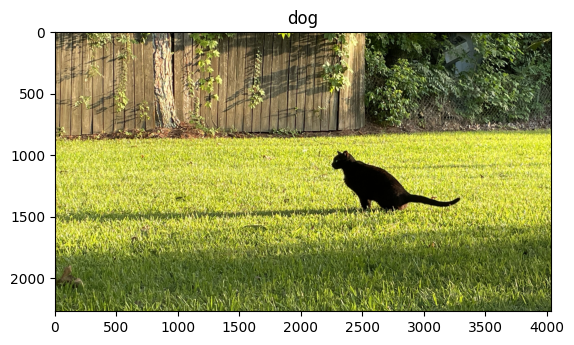

...

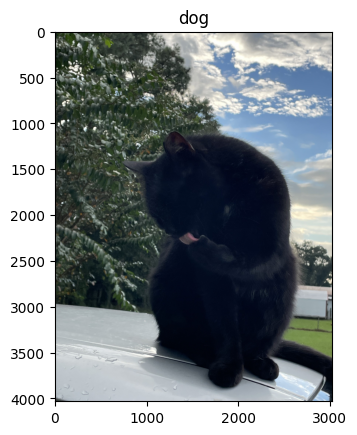

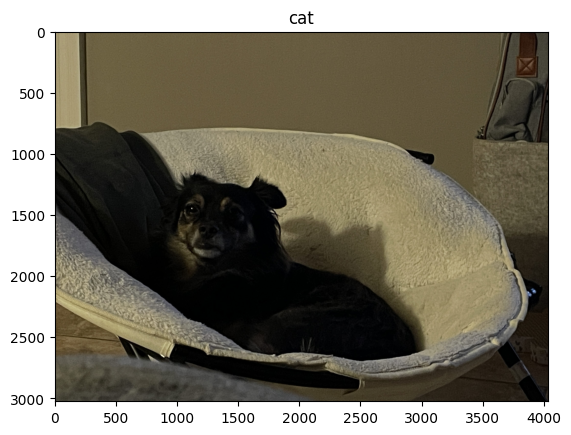

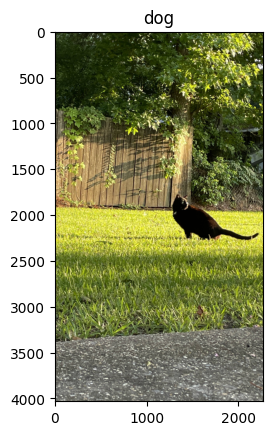

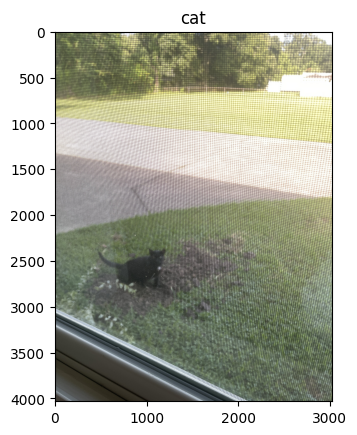

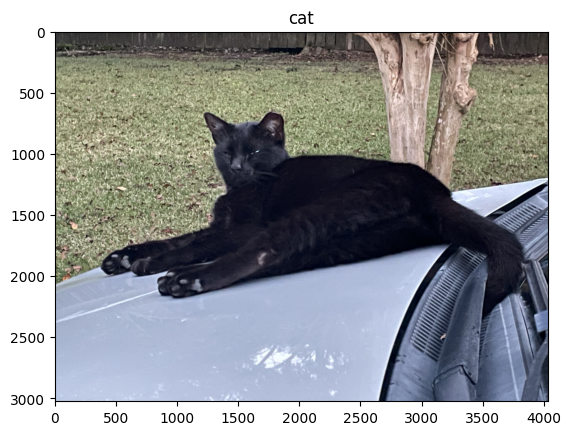

In [77]:
from transformers import ViTImageProcessor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

import os


processor = ViTImageProcessor.from_pretrained("cmps422_demo/vit_fine_tuned-f1")
model = ViTForImageClassification.from_pretrained("cmps422_demo/vit_fine_tuned-f1")

for filen in os.listdir("cmps422_demo/images2"):
    if file.endswith('.jpg'):
      path = os.path.join("cmps422_demo/images2", file)
      image = Image.open(path)

      inputs = processor(images=image, return_tensors="pt")
      outputs = model(**inputs)
      logits = outputs.logits
      predicted_class_idx = logits.argmax(-1).item()
      plt.imshow(image)
      plt.title(model.config.id2label[predicted_class_idx])
      plt.show()

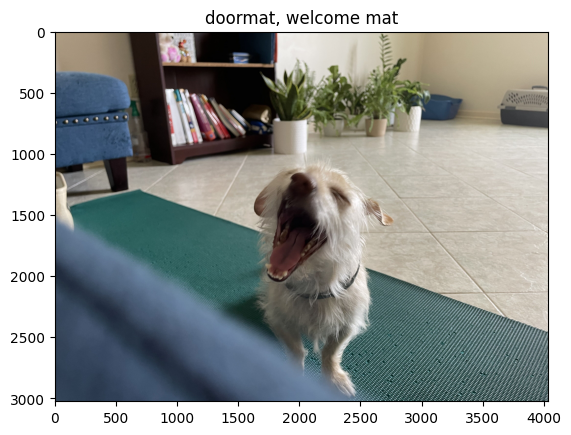

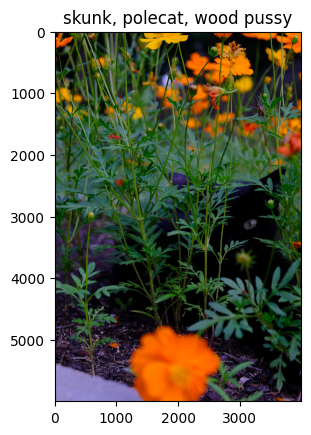

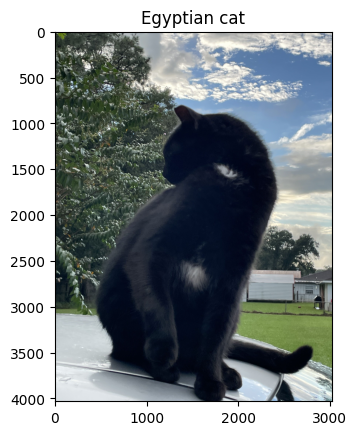

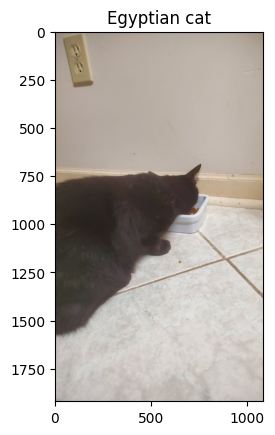

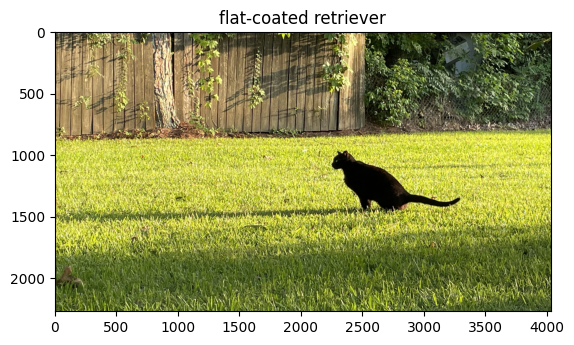

...

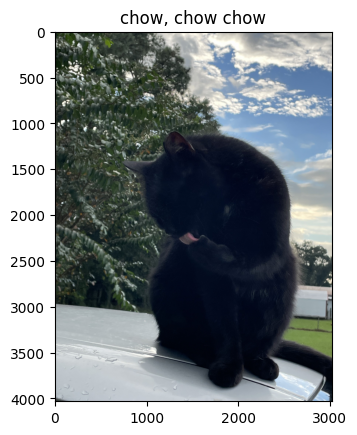

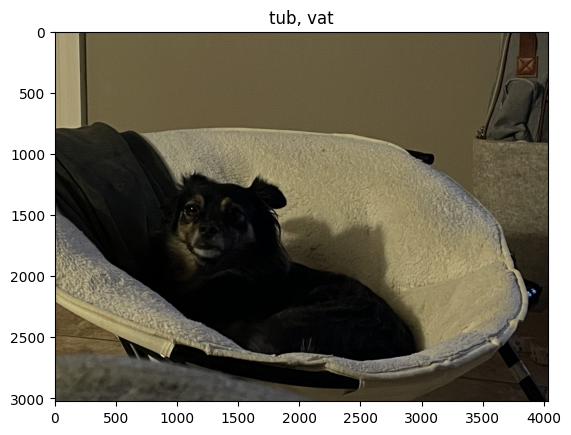

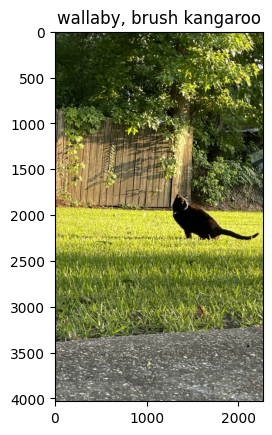

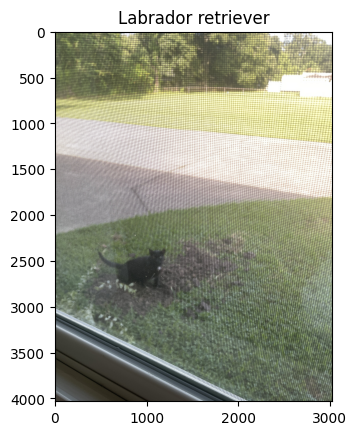

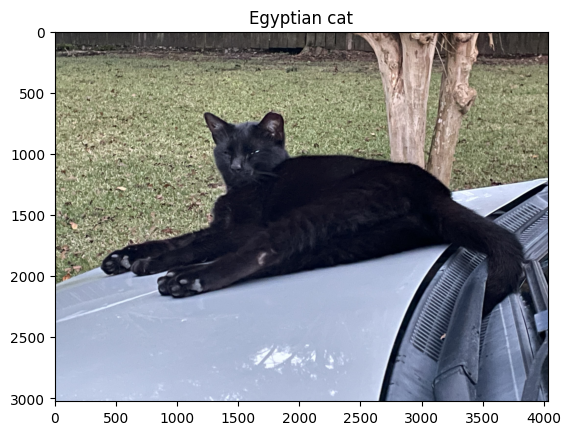

In [76]:
from transformers import ViTImageProcessor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

import os

processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

for file in os.listdir("cmps422_demo/images2"):
    if file.endswith('.jpg'):
      path = os.path.join("cmps422_demo/images2", file)
      image = Image.open(path)

      inputs = processor(images=image, return_tensors="pt")
      outputs = model(**inputs)
      logits = outputs.logits
      predicted_class_idx = logits.argmax(-1).item()
      plt.imshow(image)
      plt.title(model.config.id2label[predicted_class_idx])
      plt.show()